# Proceso de aprendizaje y consistencia

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline


Implementación del descenso de gradiente

In [10]:
np.random.seed(0)

n = 100

x1 = np.random.uniform(-2, 2, n)
x2 = np.random.uniform(-2, 2, n)

# Plano verdadero
beta_true = np.array([1.0, 2.0, -1.0])  # intercepto, x1, x2

y = (
    beta_true[0]
    + beta_true[1] * x1
    + beta_true[2] * x2
    + np.random.normal(0, 1, n)
)

X = np.column_stack([np.ones(n), x1, x2])

In [11]:
def gradient_descent(X, y, lr=0.1, n_iters=40):
    n, p = X.shape
    beta = np.zeros(p)
    history = []

    for _ in range(n_iters):
        y_pred = X @ beta
        grad = (2 / n) * X.T @ (y_pred - y)
        beta -= lr * grad
        history.append(beta.copy())

    return history

beta_history = gradient_descent(X, y, lr=0.01, n_iters=100)

In [12]:
x1_grid = np.linspace(x1.min(), x1.max(), 20)
x2_grid = np.linspace(x2.min(), x2.max(), 20)
X1g, X2g = np.meshgrid(x1_grid, x2_grid)


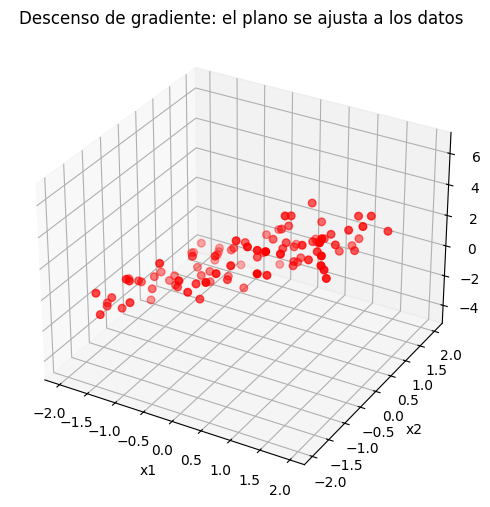

In [13]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(projection="3d")

# Datos
ax.scatter(x1, x2, y, color="red", s=30, label="Datos")

ax.set_xlabel("x1")
ax.set_ylabel("x2")
ax.set_zlabel("y")
ax.set_title("Descenso de gradiente: el plano se ajusta a los datos")

plane = None


In [14]:
def update(frame):
    global plane

    if plane is not None:
        plane.remove()

    beta = beta_history[frame]
    Z = beta[0] + beta[1] * X1g + beta[2] * X2g

    plane = ax.plot_surface(
        X1g, X2g, Z,
        alpha=0.6,
        cmap="viridis"
    )

    return plane,


In [15]:
ani = FuncAnimation(
    fig,
    update,
    frames=len(beta_history),
    interval=300,
    blit=False
)


In [16]:
HTML(ani.to_jshtml())

Maldición de la dimensionalidad

In [2]:
# -----------------------------
# 1. Simulación de datos
# -----------------------------
np.random.seed(42)

n_samples = 50000       # número de observaciones
n_features = 1000       # alta dimensión
n_informative = 50    # variables realmente relevantes
noise_std = 2.0

In [25]:
X

array([[0.37454012, 0.95071431, 0.73199394, ..., 0.13681863, 0.95023735,
        0.44600577],
       [0.18513293, 0.54190095, 0.87294584, ..., 0.06895802, 0.05705472,
        0.28218707],
       [0.26170568, 0.2469788 , 0.90625458, ..., 0.30978786, 0.29004553,
        0.87141403],
       ...,
       [0.74241501, 0.51940191, 0.08421576, ..., 0.60057493, 0.33110675,
        0.49289294],
       [0.58617804, 0.0805128 , 0.42991869, ..., 0.90721274, 0.27252095,
        0.16946522],
       [0.47519494, 0.51070744, 0.82934476, ..., 0.43227829, 0.49120593,
        0.61295732]])

In [3]:
X = np.random.uniform(size=( n_samples, n_features))

In [4]:
# Coeficientes verdaderos (solo algunos son no cero)
true_beta = np.zeros(n_features)
coefficient_position = np.random.choice([i for i in range(1000)], size = n_informative)
for coefficient in coefficient_position:
  true_beta[coefficient] = np.random.rand()

In [5]:
true_beta

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.52528126, 0.        , 0.        ,
       0.33922138, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.94724016, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.41621086, 0.     

In [6]:
# Variable respuesta
y = X @ true_beta + noise_std * np.random.randn(n_samples)

In [27]:

# -----------------------------
# 2. Train / test split
# -----------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

In [28]:

# -----------------------------
# 3. Regresión lineal
# -----------------------------
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

y_pred_lin = lin_reg.predict(X_test)
mse_lin = mean_squared_error(y_test, y_pred_lin)


In [29]:

# -----------------------------
# 4. K-vecinos más cercanos
#    (escalado MUY importante en alta dimensión)
# -----------------------------
knn = Pipeline([
    ("scaler", StandardScaler()),
    ("knn", KNeighborsRegressor(n_neighbors=100))
])


In [30]:
knn.fit(X_train, y_train)

y_pred_knn = knn.predict(X_test)
mse_knn = mean_squared_error(y_test, y_pred_knn)

In [31]:
# -----------------------------
# 5. Resultados
# -----------------------------
print("Resultados:")
print(f"MSE Regresión Lineal: {mse_lin:.4f}")
print(f"MSE KNN:              {mse_knn:.4f}")


Resultados:
MSE Regresión Lineal: 4.1639
MSE KNN:              5.1306


In [11]:
from sklearn.neighbors import NearestNeighbors

In [9]:
X[0:100].shape

(100, 1000)

In [23]:
nbrs = NearestNeighbors(n_neighbors=100, algorithm='ball_tree', metric = 'euclidean').fit(X[0:100])
distances, indices = nbrs.kneighbors(X[0:100])
indices

array([[ 0, 33, 99, ..., 47, 21, 40],
       [ 1, 65, 99, ..., 91, 85, 64],
       [ 2, 10, 24, ..., 57, 27, 85],
       ...,
       [97, 25, 79, ..., 95, 80, 56],
       [98, 25, 52, ..., 51, 27, 85],
       [99, 63, 98, ..., 75, 68, 24]])

In [24]:
distances

array([[ 0.        , 12.31056102, 12.41273603, ..., 13.38767974,
        13.49214714, 13.62725075],
       [ 0.        , 12.38302068, 12.39971604, ..., 13.43113902,
        13.52291795, 13.6257935 ],
       [ 0.        , 12.39409057, 12.43134723, ..., 13.41331363,
        13.41866162, 13.43623664],
       ...,
       [ 0.        , 12.12957361, 12.49239614, ..., 13.33628656,
        13.38943601, 13.47393855],
       [ 0.        , 12.27837725, 12.31518988, ..., 13.19502385,
        13.19644584, 13.21826206],
       [ 0.        , 12.30557971, 12.36608328, ..., 13.309992  ,
        13.32087391, 13.46124434]])